<a href="https://colab.research.google.com/github/ilman79/Machine-Learning/blob/main/Machine_Learning_Model%202.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Dataset Traffic Sign



> Dataset dapat diakses melalui [dataset](https://app.roboflow.com/ilman-gifari-utdmyrrd-waisv/1)

**Summary Dataset**

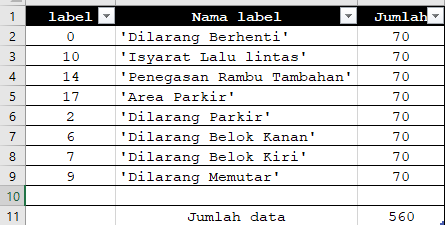


In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="KejPrmraTx3cJcS8T3qz")
project = rf.workspace("ilman-gifari-utdmy").project("rrd-waisv")
dataset = project.version(3).download("yolov5")


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.4 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=e2984fe5d0e8ed0487f71a4c8a0820819e801a7480905d30730e8b17f8a1ad65
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyparsing-3.0.9
  Attempting uninstall: idna
    Found existing installation: idna 3.4
    Uninstalling idna-3.4:
    

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to RRD-3 in yolov5pytorch:: 100%|██████████| 1428/1428 [00:00<00:00, 1980.34it/s]


In [1]:
!pip install utils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import torch
import utils



> Import modul yolov5



In [2]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -U -r yolov5/requirements.txt  # install dependencies
%cd /content/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15965, done.
remote: Counting objects: 100% (134/134), done.
remote: Compressing objects: 100% (59/59), done.
remote: Total 15965 (delta 83), reused 116 (delta 75), pack-reused 15831
Receiving objects: 100% (15965/15965), 14.60 MiB | 18.46 MiB/s, done.
Resolving deltas: 100% (10952/10952), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 77.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 86.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.6/62.6 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 593.5/593.5 kB 50.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 91.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 68.7 MB/s 

/content/yolov5


# Define Model Configuration and Architecture


In [1]:
# define number of classes based on YAML
import yaml
with open('/content/yolov5/models/yolov5s.yaml', 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [2]:
#contoh the model configuration
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]

In [3]:
#mengubah text pada yaml
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [4]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# YOLOv5 Model Configuration

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [5]:
# Mengubah konfigurasi label
%cat /content/RRD-3/data.yaml

names:
- '0'
- '10'
- '14'
- '17'
- '2'
- '6'
- '7'
- '9'
nc: 8
roboflow:
  license: CC BY 4.0
  project: rrd-waisv
  url: https://universe.roboflow.com/ilman-gifari-utdmy/rrd-waisv/dataset/3
  version: 3
  workspace: ilman-gifari-utdmy
test: ../test/images
train: RRD-3/train/images
val: RRD-3/valid/images


In [8]:
%%writetemplate /content/RRD-3/data.yaml
names:
- 'Dilarang Berhenti'
- 'Isyarat Lalu lintas'
- 'Penegasan Rambu Tambahan'
- 'Area Parkir'
- 'Dilarang Parkir'
- 'Dilarang Belok Kanan'
- 'Dilarang Belok Kiri'
- 'Dilarang Memutar'
nc: 8
roboflow:
  license: CC BY 4.0
  project: rrd-waisv
  url: https://universe.roboflow.com/ilman-gifari-utdmy/rrd-waisv/dataset/1
  version: 1
  workspace: ilman-gifari-utdmy
path: /content/RRD-3
test: /content/RRD-3/test/images/
train: /content/RRD-3/train/images/
val: /content/RRD-3/valid/images/

# Train Custom YOLOv5 Detector
Next, we'll fire off training!

In [9]:
# train yolov5s pada data custome dengan 100 epochs
# set waktu
%%time
%cd /content/yolov5/
!python train.py --img 256 --batch 16 --epochs 100 --data /content/RRD-3/data.yaml --cfg ./models/custom_yolov5s.yaml --weights yolov5s.pt --name yolov5s_results  --cache

/content/yolov5
train: weights=yolov5s.pt, cfg=./models/custom_yolov5s.yaml, data=/content/RRD-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=256, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-175-g5f11555 Python-3.10.11 torch-2.0.1+cu118 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_g

# Evaluate Custom YOLOv5 Detector Performance

In [10]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"

%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

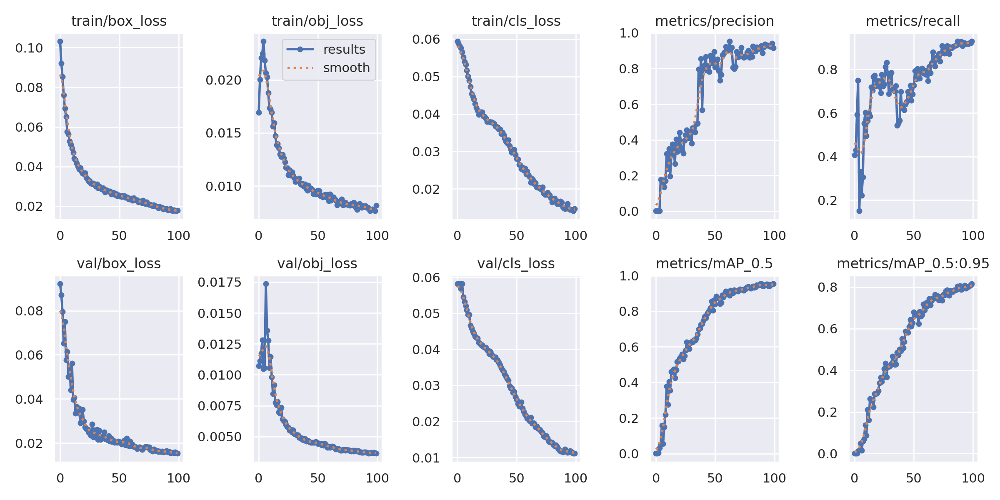

In [11]:
from IPython.display import Image
Image(filename='/content/yolov5/runs/train/yolov5s_results2/results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


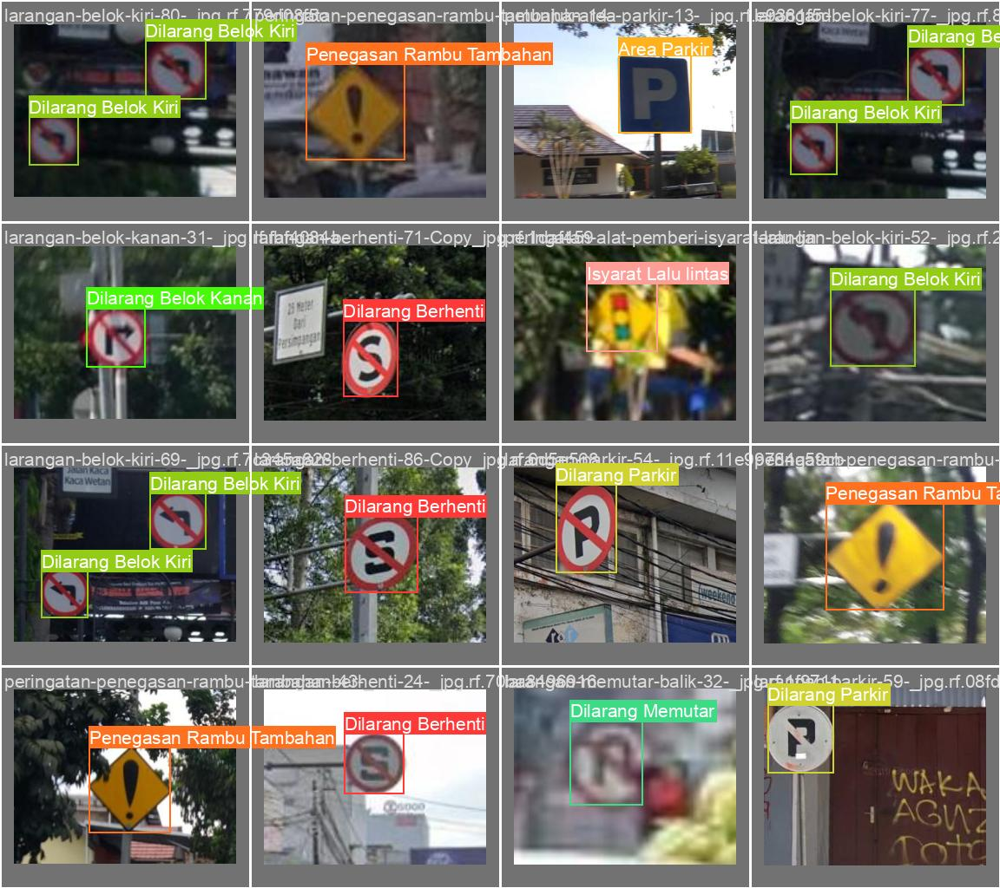

In [12]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results2/val_batch1_labels.jpg', width=900)

GROUND WRONN TRAINING DATA:


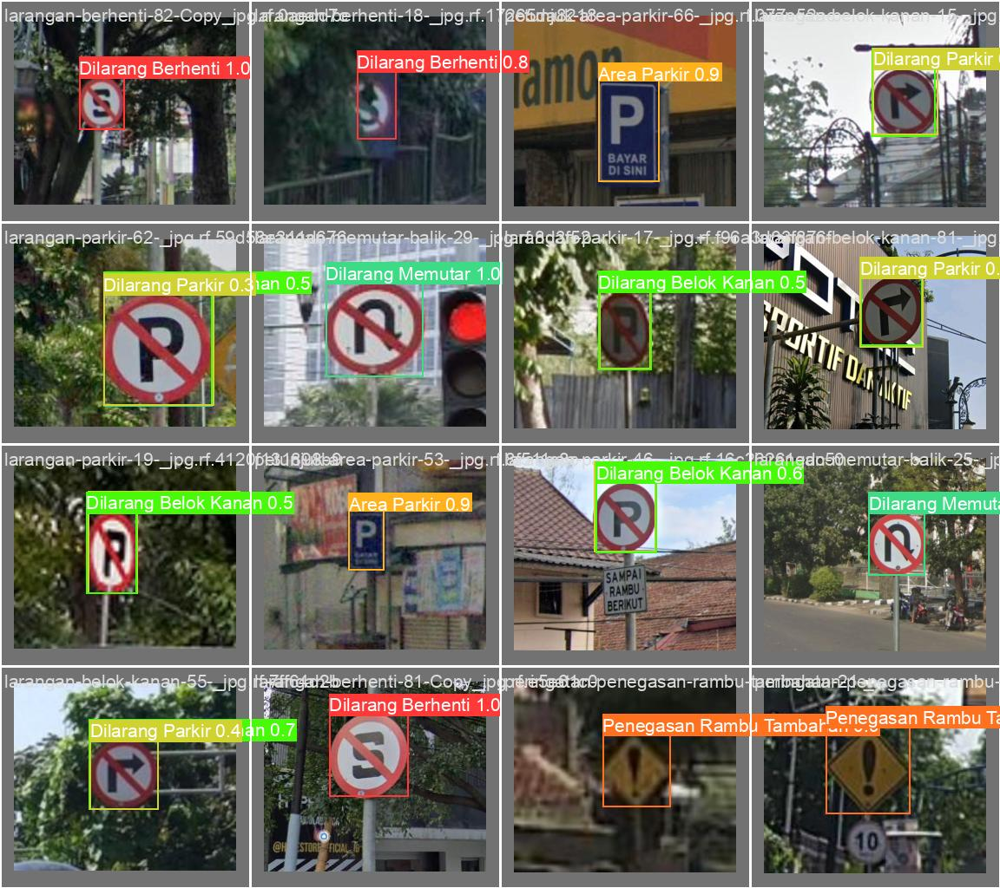

In [13]:
# first, display our ground truth data
print("GROUND WRONN TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results2/val_batch2_pred.jpg', width=900)

#Uji coba model yang sudah dibuat

In [15]:
%ls runs/train/yolov5s_results2/weights

best.pt  last.pt


In [17]:
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results2/weights/best.pt --img 416 --conf 0.4 --source /content/RRD-3/test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results2/weights/best.pt'], source=/content/RRD-3/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-175-g5f11555 Python-3.10.11 torch-2.0.1+cu118 CPU

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7265397 parameters, 0 gradients
image 1/73 /content/RRD-3/test/images/larangan-belok-kanan-34-_jpg.rf.bd2e9387c9c3079299da59c237465ef3.jpg: 352x416 1 Dilarang Belok Kanan, 278.1ms
image 2/73 /content/RRD-3/test/images/larangan-belok-kanan-36-_jpg.rf.81bdfc5b3918544f7524c38b1f985d78.jpg: 416x416 1 Dilarang Belok Kanan, 311.3ms
image 3/73 /content/RRD-3/test/images/laran

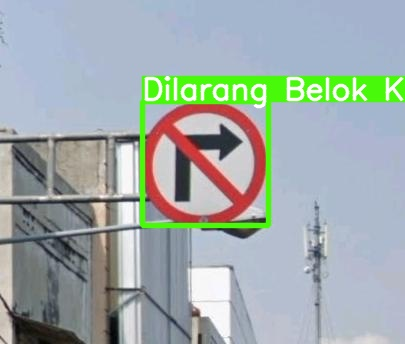

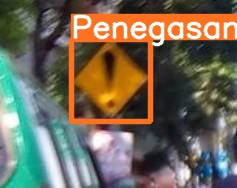

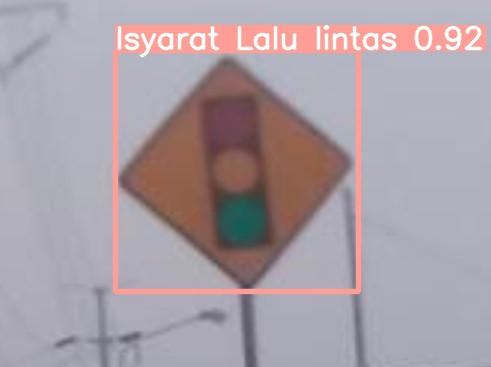

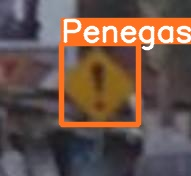

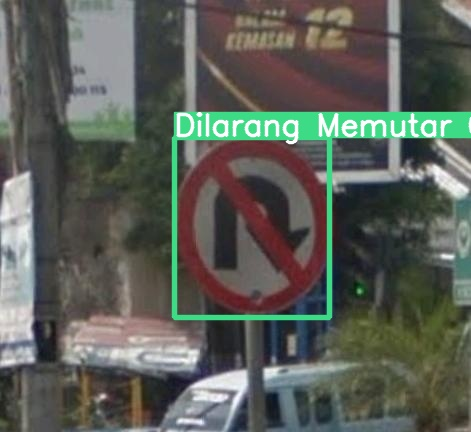

...

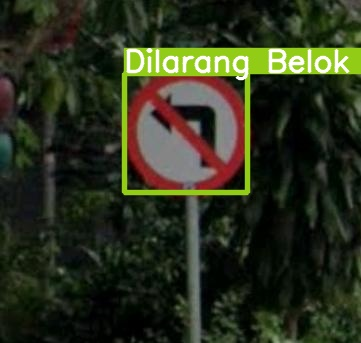

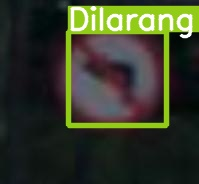

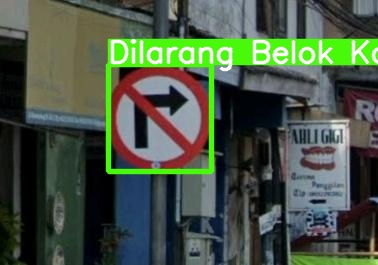

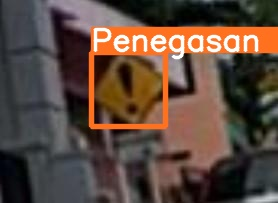

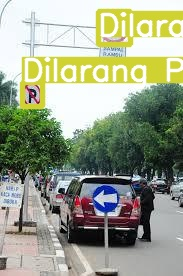

In [18]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-6-5 Python-3.10.11 torch-2.0.1+cu118 CPU

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7265397 parameters, 0 gradients
Adding AutoShape... 


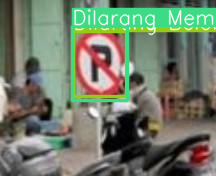

In [16]:
import torch
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/yolov5/runs/train/yolov5s_results2/weights/best.pt') 
# Image
img = '/content/RRD-3/test/images/larangan-parkir-23-_jpg.rf.7ffb6799e521795ec417a6174d80ca7b.jpg'
# Inference
results = model(img)
# Results, change the flowing to: results.show()
results.show()  # or .show(), .save(), .crop(), .pandas(), etc

In [17]:
import cv2
import torch
from torchvision import transforms

def webcam_detection():
    # Load model
    model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/yolov5/runs/train/yolov5s_results2/weights/best.pt') 

    # Set device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # Open webcam
    cap = cv2.VideoCapture(0)

    while True:
        # Read frame from webcam
        ret, frame = cap.read()
        if not ret:
            break

        # Preprocess frame
        img = transforms.ToTensor()(frame).unsqueeze(0).to(device)

        # Perform object detection
        results = model(img)

        # Process detection results
        detections = results.pred[0].detach().cpu().numpy()
        for det in detections:
            x1, y1, x2, y2, conf, cls = det[:6]
            label = f"{model.names[int(cls)]}: {conf:.2f}"
            cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
            cv2.putText(frame, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

        # Display the frame
        cv2.imshow('YOLOv5 Webcam Demo', frame)

        # Exit loop if 'q' is pressed
        if cv2.waitKey(1) == ord('q'):
            break

    # Release the webcam and close windows
    cap.release()
    cv2.destroyAllWindows()

webcam_detection()


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-6-5 Python-3.10.11 torch-2.0.1+cu118 CPU

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7265397 parameters, 0 gradients
Adding AutoShape... 



# Export Trained Weights for Future Inference
Download model yang telah kita training, yang nantinya akan diuji coba melalui aplikasi android


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/My\ Drive